# Problem Statement

2.	Most cancers form a lump called a tumour. But not all lumps are cancerous. Doctors extract a sample from the lump and examine it to find out if it’s cancer or not. Lumps that are not cancerous are called benign (be-NINE). Lumps that are cancerous are called malignant (muh-LIG-nunt). Obtaining incorrect results (false positives and false negatives) especially in a medical condition such as cancer is dangerous. So, perform Bagging, Boosting, Stacking, and Voting algorithms to increase model performance and provide your insights in the documentation.

------ ### -------

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

In [2]:
data = pd.read_csv("Tumor_Ensemble.csv")
data.shape

(569, 32)

We have 569 rows and 32 columns

Lets explore our dataset

In [3]:
data.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'points_mean', 'symmetry_mean', 'dimension_mean', 'radius_se',
       'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'points_se', 'symmetry_se',
       'dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst',
       'area_worst', 'smoothness_worst', 'compactness_worst',
       'concavity_worst', 'points_worst', 'symmetry_worst', 'dimension_worst'],
      dtype='object')

We will remove ID column as it does not helps us in anyway

In [4]:
data = data.drop(columns='id')
data.shape

(569, 31)

In [5]:
data.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'points_mean', 'symmetry_mean', 'dimension_mean', 'radius_se',
       'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'points_se', 'symmetry_se',
       'dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst',
       'area_worst', 'smoothness_worst', 'compactness_worst',
       'concavity_worst', 'points_worst', 'symmetry_worst', 'dimension_worst'],
      dtype='object')

In [6]:
data.dtypes

diagnosis             object
radius_mean          float64
texture_mean         float64
perimeter_mean       float64
area_mean            float64
smoothness_mean      float64
compactness_mean     float64
concavity_mean       float64
points_mean          float64
symmetry_mean        float64
dimension_mean       float64
radius_se            float64
texture_se           float64
perimeter_se         float64
area_se              float64
smoothness_se        float64
compactness_se       float64
concavity_se         float64
points_se            float64
symmetry_se          float64
dimension_se         float64
radius_worst         float64
texture_worst        float64
perimeter_worst      float64
area_worst           float64
smoothness_worst     float64
compactness_worst    float64
concavity_worst      float64
points_worst         float64
symmetry_worst       float64
dimension_worst      float64
dtype: object

Lets check if we have any missing value in our dataset

<AxesSubplot:>

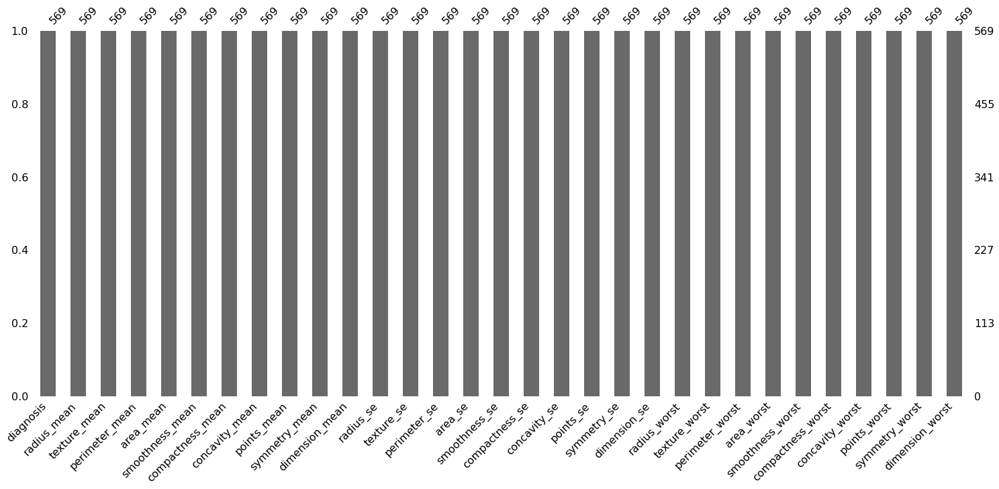

In [7]:
msno.bar(data)

There is no missing value in our dataset

Lets see how related columns are with each other

In [8]:
data.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'points_mean', 'symmetry_mean', 'dimension_mean', 'radius_se',
       'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'points_se', 'symmetry_se',
       'dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst',
       'area_worst', 'smoothness_worst', 'compactness_worst',
       'concavity_worst', 'points_worst', 'symmetry_worst', 'dimension_worst'],
      dtype='object')

<AxesSubplot:>

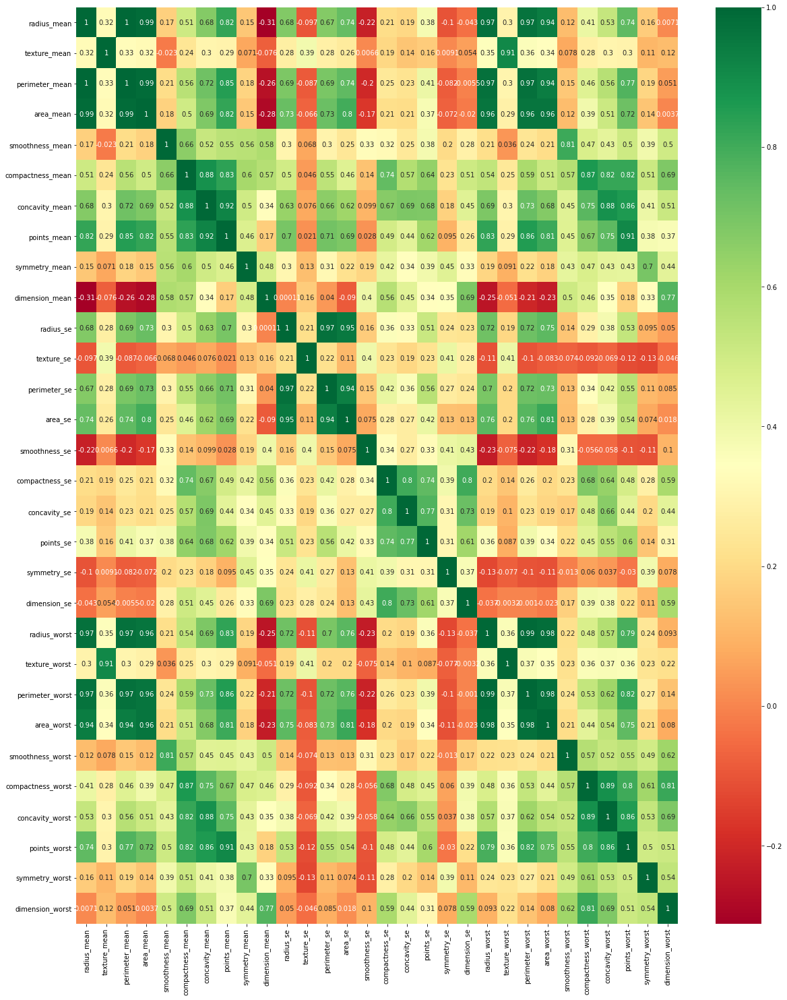

In [9]:
plt.rcParams['figure.figsize'] = (20,25)

sns.heatmap(data[['radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'points_mean', 'symmetry_mean', 'dimension_mean', 'radius_se',
       'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'points_se', 'symmetry_se',
       'dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst',
       'area_worst', 'smoothness_worst', 'compactness_worst',
       'concavity_worst', 'points_worst', 'symmetry_worst', 'dimension_worst']].corr(), cmap='RdYlGn', annot=True)

In [11]:
data.head(15)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,B,12.32,12.39,78.85,464.1,0.10280,0.06981,0.039870,0.037000,0.1959,...,13.50,15.64,86.97,549.1,0.1385,0.12660,0.124200,0.09391,0.2827,0.06771
1,B,10.60,18.95,69.28,346.4,0.09688,0.11470,0.063870,0.026420,0.1922,...,11.88,22.94,78.28,424.8,0.1213,0.25150,0.191600,0.07926,0.2940,0.07587
2,B,11.04,16.83,70.92,373.2,0.10770,0.07804,0.030460,0.024800,0.1714,...,12.41,26.44,79.93,471.4,0.1369,0.14820,0.106700,0.07431,0.2998,0.07881
3,B,11.28,13.39,73.00,384.8,0.11640,0.11360,0.046350,0.047960,0.1771,...,11.92,15.77,76.53,434.0,0.1367,0.18220,0.086690,0.08611,0.2102,0.06784
4,B,15.19,13.21,97.65,711.8,0.07963,0.06934,0.033930,0.026570,0.1721,...,16.20,15.73,104.50,819.1,0.1126,0.17370,0.136200,0.08178,0.2487,0.06766
5,B,11.57,19.04,74.20,409.7,0.08546,0.07722,0.054850,0.014280,0.2031,...,13.07,26.98,86.43,520.5,0.1249,0.19370,0.256000,0.06664,0.3035,0.08284
6,B,11.51,23.93,74.52,403.5,0.09261,0.10210,0.111200,0.041050,0.1388,...,12.48,37.16,82.28,474.2,0.1298,0.25170,0.363000,0.09653,0.2112,0.08732
7,M,13.81,23.75,91.56,597.8,0.13230,0.17680,0.155800,0.091760,0.2251,...,19.20,41.85,128.50,1153.0,0.2226,0.52090,0.464600,0.20130,0.4432,0.10860
8,B,10.49,19.29,67.41,336.1,0.09989,0.08578,0.029950,0.012010,0.2217,...,11.54,23.31,74.22,402.8,0.1219,0.14860,0.079870,0.03203,0.2826,0.07552
9,B,11.06,14.96,71.49,373.9,0.10330,0.09097,0.053970,0.033410,0.1776,...,11.92,19.90,79.76,440.0,0.1418,0.22100,0.229900,0.10750,0.3301,0.09080


Our Class variable column is B and M, we will use LabelEncoder to convert them into 1 and 0

In [12]:
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()

data['diagnosis'] = lb.fit_transform(data['diagnosis'])
data.head(15)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,0,12.32,12.39,78.85,464.1,0.10280,0.06981,0.039870,0.037000,0.1959,...,13.50,15.64,86.97,549.1,0.1385,0.12660,0.124200,0.09391,0.2827,0.06771
1,0,10.60,18.95,69.28,346.4,0.09688,0.11470,0.063870,0.026420,0.1922,...,11.88,22.94,78.28,424.8,0.1213,0.25150,0.191600,0.07926,0.2940,0.07587
2,0,11.04,16.83,70.92,373.2,0.10770,0.07804,0.030460,0.024800,0.1714,...,12.41,26.44,79.93,471.4,0.1369,0.14820,0.106700,0.07431,0.2998,0.07881
3,0,11.28,13.39,73.00,384.8,0.11640,0.11360,0.046350,0.047960,0.1771,...,11.92,15.77,76.53,434.0,0.1367,0.18220,0.086690,0.08611,0.2102,0.06784
4,0,15.19,13.21,97.65,711.8,0.07963,0.06934,0.033930,0.026570,0.1721,...,16.20,15.73,104.50,819.1,0.1126,0.17370,0.136200,0.08178,0.2487,0.06766
5,0,11.57,19.04,74.20,409.7,0.08546,0.07722,0.054850,0.014280,0.2031,...,13.07,26.98,86.43,520.5,0.1249,0.19370,0.256000,0.06664,0.3035,0.08284
6,0,11.51,23.93,74.52,403.5,0.09261,0.10210,0.111200,0.041050,0.1388,...,12.48,37.16,82.28,474.2,0.1298,0.25170,0.363000,0.09653,0.2112,0.08732
7,1,13.81,23.75,91.56,597.8,0.13230,0.17680,0.155800,0.091760,0.2251,...,19.20,41.85,128.50,1153.0,0.2226,0.52090,0.464600,0.20130,0.4432,0.10860
8,0,10.49,19.29,67.41,336.1,0.09989,0.08578,0.029950,0.012010,0.2217,...,11.54,23.31,74.22,402.8,0.1219,0.14860,0.079870,0.03203,0.2826,0.07552
9,0,11.06,14.96,71.49,373.9,0.10330,0.09097,0.053970,0.033410,0.1776,...,11.92,19.90,79.76,440.0,0.1418,0.22100,0.229900,0.10750,0.3301,0.09080


 0 = B and 1 = M

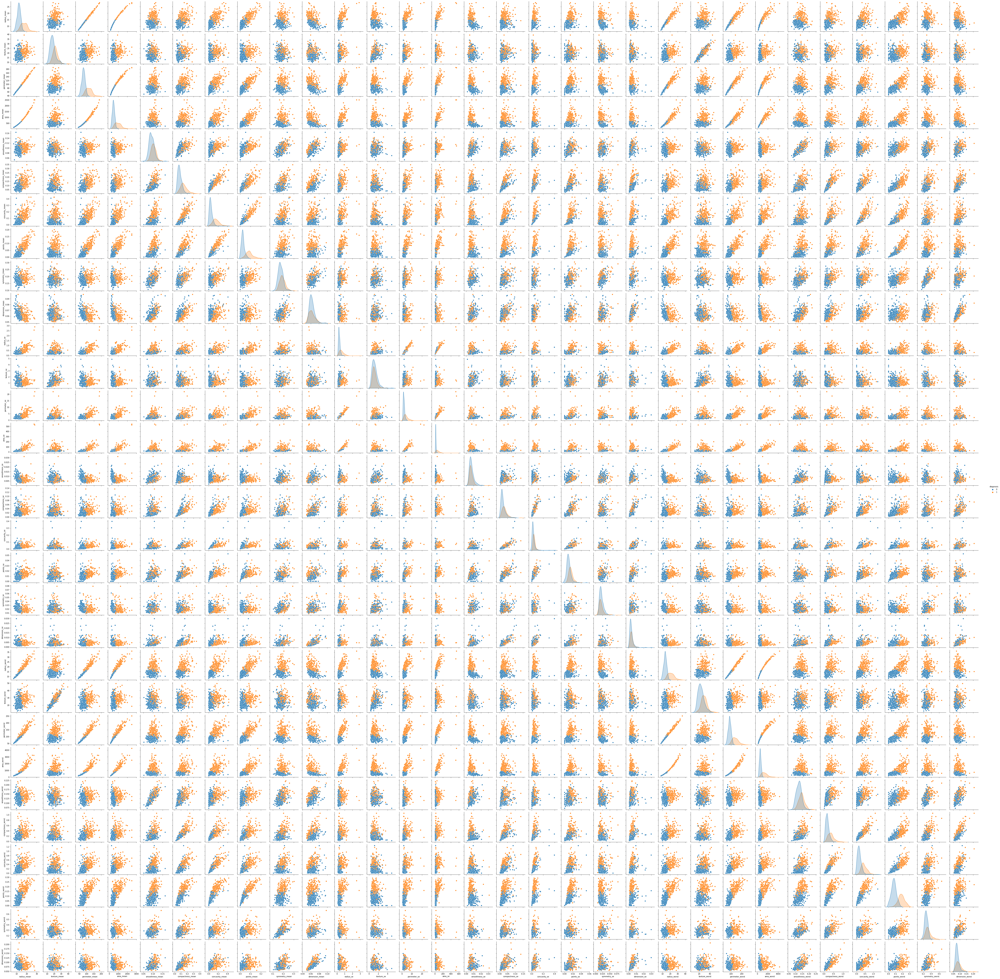

In [13]:
sns.pairplot(data, hue='diagnosis')

In [14]:
data['diagnosis'].value_counts()

0    357
1    212
Name: diagnosis, dtype: int64

We will not start building our models

In [15]:
predictors = data.loc[:, data.columns!='diagnosis']
target = data['diagnosis']

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(predictors,target, test_size=0.3, random_state=123)
print(x_train.shape,x_test.shape,y_train.shape,y_test.shape)

(398, 30) (171, 30) (398,) (171,)


In [16]:
from sklearn.model_selection import GridSearchCV

In [17]:
import xgboost as xgb

In [18]:
xgb_clf = xgb.XGBClassifier(max_depths = 5, n_estimators = 5000, learning_rate = 0.2, n_jobs = -1)

In [19]:
xgb_clf.fit(x_train, y_train)


C:\Users\jaich\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:42:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "max_depths" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:42:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.2, max_delta_step=0, max_depth=6, max_depths=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=5000, n_jobs=-1, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [20]:
from sklearn.metrics import accuracy_score, confusion_matrix


In [21]:
# Evaluation on Testing Data
confusion_matrix(y_test, xgb_clf.predict(x_test))
accuracy_score(y_test, xgb_clf.predict(x_test))

0.9883040935672515

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

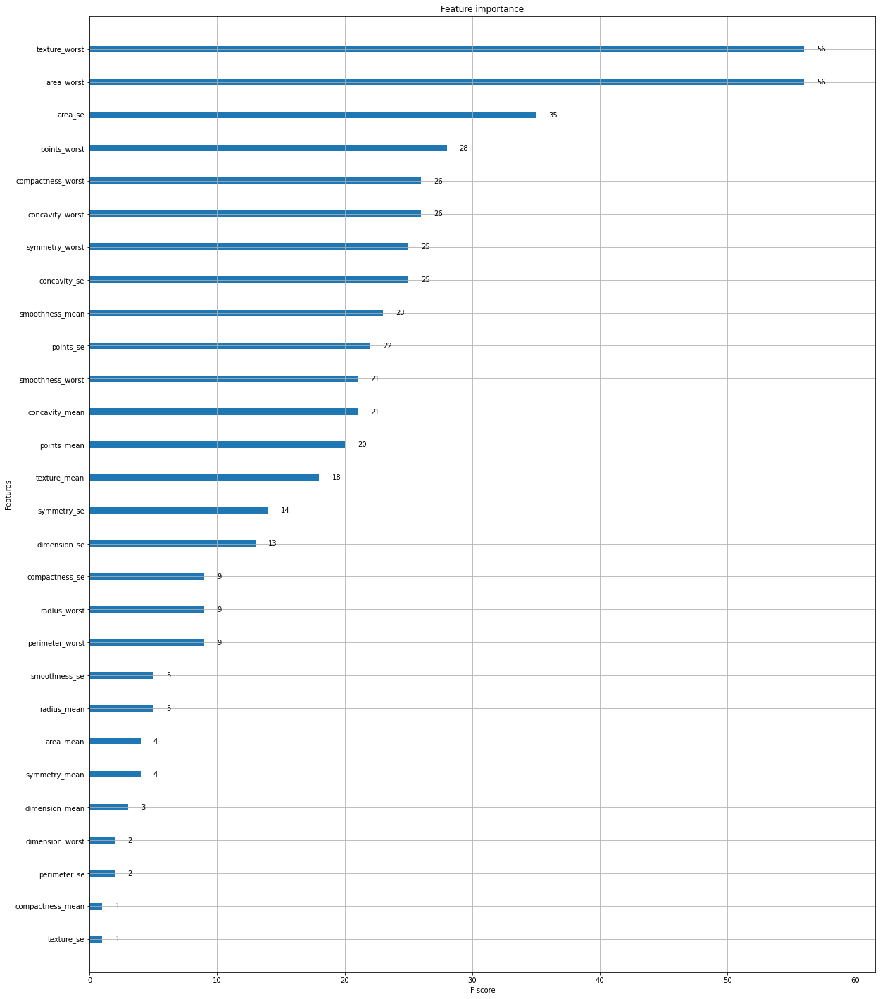

In [22]:
xgb.plot_importance(xgb_clf)

In [23]:
xgb_clf = xgb.XGBClassifier(max_depths = 5, n_estimators = 10000, learning_rate = 0.3, n_jobs = -1)


In [24]:
param_test1 = {'max_depth': range(3,10,2), 'gamma': [0.1, 0.2, 0.3],
               'subsample': [0.8, 0.9], 'colsample_bytree': [0.8, 0,9],
               'rag_alpha': [1e-2, 0.1, 1]}

In [25]:
grid_search = GridSearchCV(xgb_clf, param_test1, n_jobs = -1, cv = 5, scoring = 'accuracy')

In [26]:
grid_search.fit(x_train, y_train)


C:\Users\jaich\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [0.96234177 0.96234177 0.96234177 0.96234177 0.96234177 0.96234177
 0.95727848 0.95984177 0.95727848 0.95984177 0.95727848 0.95984177
 0.95727848 0.95984177 0.95727848 0.95984177 0.95727848 0.95984177
 0.95727848 0.95984177 0.95727848 0.95984177 0.95727848 0.95984177
 0.96734177 0.95981013 0.96734177 0.95981013 0.96734177 0.95981013
 0.95727848 0.95987342 0.95727848 0.95987342 0.95727848 0.95987342
 0.95727848 0.95987342 0.95727848 0.95987342 0.95727848 0.95987342
 0.95727848 0.95987342 0.95727848 0.95987342 0.95727848 0.95987342
 0.95977848 0.95227848 0.95977848 0.95227848 0.95977848 0.95227848
 0.95984177 0.95481013 0.95984177 0.95481013 0.95984177 0.95481013
 0.95984177 0.95481013 0.95984177 0.95481013 0.95984177 0.95481013
 0.95984177 0.95481013 0.95984177 0.95481013 0.95984177 0.95481013
 0.96731013 0.96987342 0.96731013 0.96987342 0.967310

[21:10:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "max_depths", "rag_alpha" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:10:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=0.3, max_delta_step=None,
                                     max_depth=None, max_depths=5,
                                     min_child_weight=None, missing=nan,
                                     monotone_constraints=None,
                                     n_estimators=10000, n_jobs=-1,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
    

In [27]:
cv_xg_clf = grid_search.best_estimator_
cv_xg_clf

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0, gamma=0.2, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.3, max_delta_step=0, max_depth=7, max_depths=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=10000, n_jobs=-1, num_parallel_tree=1,
              rag_alpha=0.01, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=0.8, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [28]:
# Evaluation on Testing Data with model with hyperparameter
accuracy_score(y_test, cv_xg_clf.predict(x_test))

0.9473684210526315

In [29]:
grid_search.best_params_

{'colsample_bytree': 0,
 'gamma': 0.2,
 'max_depth': 7,
 'rag_alpha': 0.01,
 'subsample': 0.8}

# AdaBoostClassifier

In [30]:
from sklearn.ensemble import AdaBoostClassifier

In [31]:
ada_clf = AdaBoostClassifier(learning_rate=0.02, n_estimators=5000)
ada_clf.fit(x_train,y_train)

AdaBoostClassifier(learning_rate=0.02, n_estimators=5000)

In [32]:
confusion_matrix(y_test, ada_clf.predict(x_test))

array([[108,   2],
       [  2,  59]], dtype=int64)

In [33]:
accuracy_score(y_test, ada_clf.predict(x_test))


0.9766081871345029

# Bagging Classification

In [34]:
from sklearn import tree
clftree = tree.DecisionTreeClassifier()
from sklearn.ensemble import BaggingClassifier

In [35]:
bag_clf = BaggingClassifier(base_estimator=clftree, n_estimators=500, bootstrap=True, n_jobs=1, random_state=42)

In [36]:
bag_clf.fit(x_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=500,
                  n_jobs=1, random_state=42)

In [37]:
# Evaluation on Testing Data
confusion_matrix(y_test, bag_clf.predict(x_test))

array([[109,   1],
       [  4,  57]], dtype=int64)

In [38]:
accuracy_score(y_test, bag_clf.predict(x_test))

0.9707602339181286

# Stacking Classification

In [39]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn import metrics

#### Creating the ensembles base learners and meta learner

In [42]:
base_learners = []

#### KNN Classifier model

In [43]:
knn = KNeighborsClassifier(n_neighbors=3)
base_learners.append(knn)

#### Decision Tree Classifier

In [44]:
dtr = DecisionTreeClassifier(max_depth=4, random_state=123)
base_learners.append(dtr)

#### Multi Layered Perception Classifier

In [45]:
mlpc = MLPClassifier(hidden_layer_sizes=(100,), solver = 'lbfgs', random_state=123)
base_learners.append(mlpc)

#### Meta Model Using Logistic Regression

In [46]:
meta_learner = LogisticRegression(solver='lbfgs')

In [47]:
# Create variables to store meta data and the targets
meta_data = np.zeros((len(base_learners), len(x_train)))
meta_targets = np.zeros(len(y_train))

In [48]:
# Create the cross-validation folds
KF = KFold(n_splits = 5)
meta_index = 0
for train_indices, test_indices in KF.split(x_train):
    # Train each learner on the K-1 folds and create meta data for the Kth fold
    for i in range(len(base_learners)):
        learner = base_learners[i]

        learner.fit(x_train.iloc[train_indices], y_train.iloc[train_indices])
        predictions = learner.predict_proba(x_train.iloc[test_indices])[:,0]

        meta_data[i][meta_index:meta_index+len(test_indices)] = predictions

    meta_targets[meta_index:meta_index+len(test_indices)] = y_train.iloc[test_indices]
    meta_index += len(test_indices)

C:\Users\jaich\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:500: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\jaich\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:500: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\jaich\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:500: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the nu

In [49]:
# Transpose the meta data to be fed into the meta learner
meta_data = meta_data.transpose()

In [50]:
# Create the meta data for the test set and evaluate the base learners
test_meta_data = np.zeros((len(base_learners), len(x_test)))
base_acc = []

for i in range(len(base_learners)):
    learner = base_learners[i]
    learner.fit(x_train, y_train)
    predictions = learner.predict_proba(x_test)[:,0]
    test_meta_data[i] = predictions

    acc = metrics.accuracy_score(y_test, learner.predict(x_test))
    base_acc.append(acc)
test_meta_data = test_meta_data.transpose()

C:\Users\jaich\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:500: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


In [51]:
# Fit the meta learner on the train set and evaluate it on the test set
meta_learner.fit(meta_data, meta_targets)
ensemble_predictions = meta_learner.predict(test_meta_data)

In [52]:
acc = metrics.accuracy_score(y_test, ensemble_predictions)
acc

0.935672514619883

In [53]:
# Print the results
for i in range(len(base_learners)):
    learner = base_learners[i]

    print(f'{base_acc[i]:.2f} {learner.__class__.__name__}')
    
print(f'{acc:.2f} Ensemble')

0.92 KNeighborsClassifier
0.94 DecisionTreeClassifier
0.64 MLPClassifier
0.94 Ensemble


#### Voting Hard and Soft

In [54]:
from sklearn import linear_model, svm, neighbors, naive_bayes
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score

# Instantiate the learners (classifiers)
learner_1 = neighbors.KNeighborsClassifier(n_neighbors=5)
learner_2 = linear_model.Perceptron(tol=1e-2, random_state=0)
learner_3 = svm.SVC(gamma=0.001)

In [55]:
# Instantiate the voting classifier
voting = VotingClassifier([('KNN', learner_1),
                           ('Prc', learner_2),
                           ('SVM', learner_3)])

In [56]:
# Fit classifier with the training data
voting.fit(x_train, y_train)

VotingClassifier(estimators=[('KNN', KNeighborsClassifier()),
                             ('Prc', Perceptron(tol=0.01)),
                             ('SVM', SVC(gamma=0.001))])

In [57]:
# Predict the most voted class
hard_predictions = voting.predict(x_test)

In [58]:
# Accuracy of hard voting
print('Hard Voting:', accuracy_score(y_test, hard_predictions))

Hard Voting: 0.9415204678362573


#### Soft Voting

In [59]:
# Instantiate the learners (classifiers)
learner_4 = neighbors.KNeighborsClassifier(n_neighbors = 5)
learner_5 = naive_bayes.GaussianNB()
learner_6 = svm.SVC(gamma = 0.001, probability = True)

In [60]:
# Instantiate the voting classifier
voting = VotingClassifier([('KNN', learner_4),
                           ('NB', learner_5),
                           ('SVM', learner_6)],
                            voting = 'soft')

In [61]:
# Fit classifier with the training data
voting.fit(x_train, y_train)
learner_4.fit(x_train, y_train)
learner_5.fit(x_train, y_train)
learner_6.fit(x_train, y_train)

SVC(gamma=0.001, probability=True)

In [62]:
# Predict the most probable class
soft_predictions = voting.predict(x_test)

In [63]:
# Get the base learner predictions
predictions_4 = learner_4.predict(x_test)
predictions_5 = learner_5.predict(x_test)
predictions_6 = learner_6.predict(x_test)

In [64]:
# Accuracies of base learners
print('L4:', accuracy_score(y_test, predictions_4))
print('L5:', accuracy_score(y_test, predictions_5))
print('L6:', accuracy_score(y_test, predictions_6))

L4: 0.9239766081871345
L5: 0.9590643274853801
L6: 0.9590643274853801


In [65]:
# Accuracy of Soft voting
print('Soft Voting:', accuracy_score(y_test, soft_predictions))

Soft Voting: 0.9590643274853801


## Random Forest Classifier

In [66]:
from sklearn.ensemble import RandomForestClassifier

In [67]:
rf_clf = RandomForestClassifier(n_estimators=500, n_jobs=1, random_state=42)
rf_clf.fit(x_train,y_train)

RandomForestClassifier(n_estimators=500, n_jobs=1, random_state=42)

In [68]:
confusion_matrix(y_test, rf_clf.predict(x_test))

array([[108,   2],
       [  4,  57]], dtype=int64)

In [69]:
accuracy_score(y_test, rf_clf.predict(x_test))

0.9649122807017544

## Stacking Regression

In [70]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.model_selection import KFold
from sklearn import metrics

In [71]:
# Create the ensemble's base learners and meta-learner
# Append base learners to a list
base_learners = []

In [72]:
# KNN regression model
knn = KNeighborsRegressor(n_neighbors=5)
base_learners.append(knn)

In [73]:
# Decision Tree regressor model
dtr = DecisionTreeRegressor(max_depth=4, random_state=123456)
base_learners.append(dtr)

In [74]:
# Ridge regression
ridge = Ridge()
base_learners.append(ridge)

In [75]:
# Meta model using linear regerssion model
meta_learner = LinearRegression()

In [76]:
# Create variables to store meta data and the targets
meta_data = np.zeros((len(base_learners), len(x_train)))
meta_targets = np.zeros(len(y_train))

In [77]:
# Create the cross-validation folds
KF = KFold(n_splits = 5)
meta_index = 0
for train_indices, test_indices in KF.split(x_train):
    # Train each learner on the K-1 folds and create meta data for the Kth fold
    for i in range(len(base_learners)):
        learner = base_learners[i]

        learner.fit(x_train.iloc[train_indices], y_train.iloc[train_indices])
        predictions = learner.predict(x_train.iloc[test_indices])

        meta_data[i][meta_index:meta_index+len(test_indices)] = predictions

    meta_targets[meta_index:meta_index+len(test_indices)] = y_train.iloc[test_indices]
    meta_index += len(test_indices)

In [78]:
# Transpose the metadata to be fed into the meta-learner
meta_data = meta_data.transpose()

In [79]:
# Create the metadata for the test set and evaluate the base learners
test_meta_data = np.zeros((len(base_learners), len(x_test)))
base_errors = []
base_r2 = []
for i in range(len(base_learners)):
  learner = base_learners[i]
  learner.fit(x_train, y_train)
  predictions = learner.predict(x_test)
  test_meta_data[i] = predictions

  err = metrics.mean_squared_error(y_test, predictions)
  r2 = metrics.r2_score(y_test, predictions)

  base_errors.append(err)
  base_r2.append(r2)

test_meta_data = test_meta_data.transpose()

In [80]:
# Fit the meta-learner on the train set and evaluate it on the test set
meta_learner.fit(meta_data, meta_targets)
ensemble_predictions = meta_learner.predict(test_meta_data)

In [81]:
err = metrics.mean_squared_error(y_test, ensemble_predictions)
r2 = metrics.r2_score(y_test, ensemble_predictions)

In [82]:
# Print the results 
for i in range(len(base_learners)):
  learner = base_learners[i]
  print(f'{base_errors[i]:.1f} {base_r2[i]:.2f} {learner.__class__.__name__}')
print(f'{err:.1f} {r2:.2f} Ensemble')

0.1 0.78 KNeighborsRegressor
0.1 0.77 DecisionTreeRegressor
0.1 0.73 Ridge
0.0 0.84 Ensemble
